# Exploração dados COVID-19 em Portugal

In [1]:
import pandas as pd

# CSV loading

In [2]:
infected = pd.read_csv("data/time_series_covid19_confirmed_global.csv")
infected = infected.drop(columns=["Province/State","Lat","Long"])
infected = infected.groupby(["Country/Region"]).sum().reset_index()
infected = infected.rename(columns={"Country/Region": "Country"}) 
infected = infected.rename(columns={"4/28/20": "4/28/20_i"}) 
infected.drop(infected.columns.difference(['Country','4/28/20_i']), 1, inplace=True)
infected.head()

,Country,4/28/20_i
0,Afghanistan,1828
1,Albania,750
2,Algeria,3649
3,Andorra,743
4,Angola,27


In [3]:
deaths = pd.read_csv("data/time_series_covid19_deaths_global.csv")
deaths = deaths.drop(columns=["Province/State","Lat","Long"])
deaths = deaths.groupby(["Country/Region"]).sum().reset_index()
deaths = deaths.rename(columns={"Country/Region": "Country"}) 
deaths = deaths.rename(columns={"4/28/20": "4/28/20_d"}) 
deaths.drop(deaths.columns.difference(['Country','4/28/20_d']), 1, inplace=True)
deaths.head()

,Country,4/28/20_d
0,Afghanistan,58
1,Albania,30
2,Algeria,437
3,Andorra,41
4,Angola,2


In [4]:
recovered = pd.read_csv("data/time_series_covid19_recovered_global.csv")
recovered = recovered.drop(columns=["Province/State","Lat","Long"])
recovered = recovered.groupby(["Country/Region"]).sum().reset_index()
recovered = recovered.rename(columns={"Country/Region": "Country"}) 
recovered = recovered.rename(columns={"4/28/20": "4/28/20_r"}) 
recovered.drop(recovered.columns.difference(['Country','4/28/20_r']), 1, inplace=True)
recovered.head()

,Country,4/28/20_r
0,Afghanistan,228
1,Albania,431
2,Algeria,1651
3,Andorra,398
4,Angola,6


In [5]:
population_info = pd.read_csv("data/population_by_country_2020.csv")
population_info = population_info.rename(columns={"Country (or dependency)": "Country"}) 
population_info.drop(population_info.columns.difference(['Country','Population (2020)','Density (P/Km\u00b2)']), 1, inplace=True)
population_info.head()

,Country,Population (2020),Density (P/Km²)
0,China,1438207241,153
1,India,1377233523,464
2,US,330610570,36
3,Indonesia,272931713,151
4,Pakistan,219992900,287


In [6]:
general = infected
general = general.set_index('Country').join(deaths.set_index('Country')).reset_index()
general = general.set_index('Country').join(recovered.set_index('Country')).reset_index()
general = general.set_index('Country').join(population_info.set_index('Country')).reset_index()

general.head()

,Country,4/28/20_i,4/28/20_d,4/28/20_r,Population (2020),Density (P/Km²)
0,Afghanistan,1828,58,228,38742911.0,60.0
1,Albania,750,30,431,2878420.0,105.0
2,Algeria,3649,437,1651,43685618.0,18.0
3,Andorra,743,41,398,77240.0,164.0
4,Angola,27,2,6,32644783.0,26.0


In [7]:
general.loc[(general.Country == 'US'),'Country']='United States of America'
general.loc[(general.Country == 'Cote d\'Ivoire'),'Country']='Ivory Coast'
general.loc[(general.Country == 'DR Congo'),'Country']='Democratic Republic of the Congo'
general.loc[(general.Country == 'Congo'),'Country']='Republic of the Congo'
general.loc[(general.Country == 'Tanzania'),'Country']='United Republic of Tanzania'
general.loc[(general.Country == 'Serbia'),'Country']='Republic of Serbia'


In [8]:
import matplotlib.pyplot as plt

# Number of Infected by Country

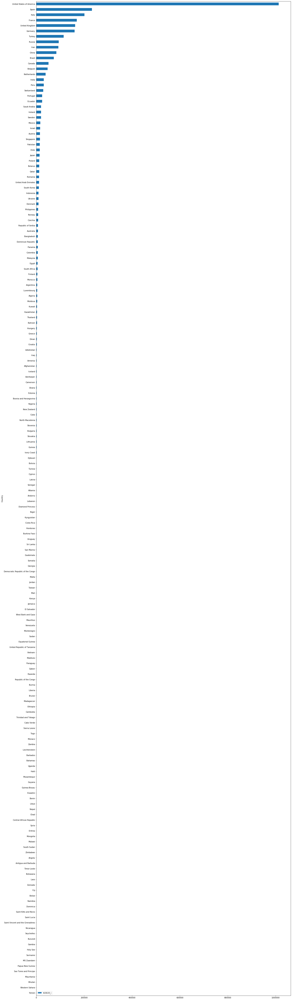

In [9]:
general = general.sort_values(by=['4/28/20_i'],ascending=True)
general.plot(kind='barh',x='Country',y='4/28/20_i',figsize=(25,100))
plt.show()

# Number of Deaths by Country

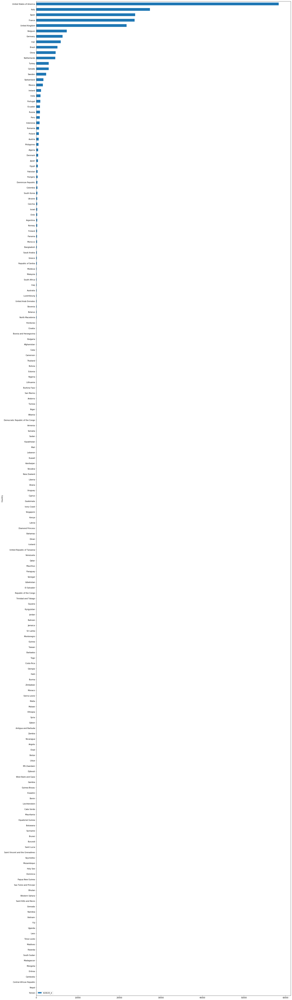

In [10]:
general = general.sort_values(by=['4/28/20_d'],ascending=True)
general.plot(kind='barh',x='Country',y='4/28/20_d',figsize=(25,100))
plt.show()

# Number of Recoveries by Country

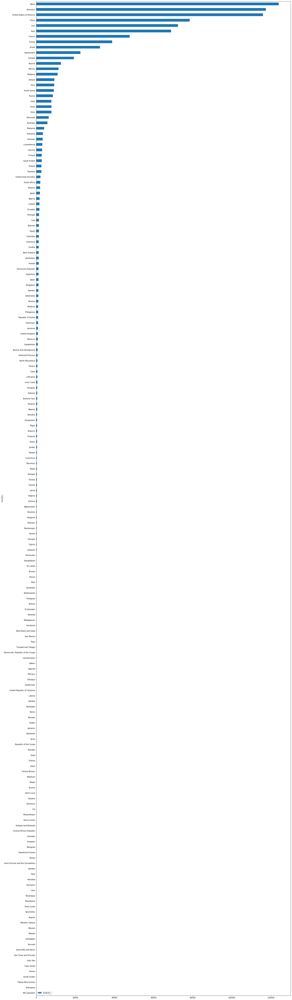

In [11]:
general = general.sort_values(by=['4/28/20_r'],ascending=True)
general.plot(kind='barh',x='Country',y='4/28/20_r',figsize=(25,100))
plt.show()

# Infection Rate by Country (Number of Infected / Total Population)

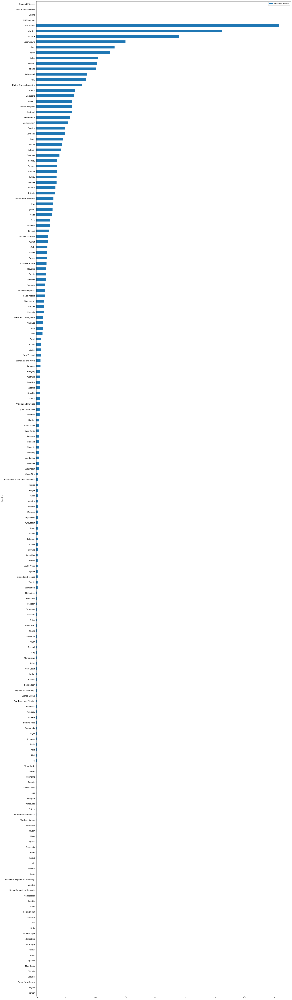

In [12]:
general["Infection Rate %"] = general["4/28/20_i"] / general["Population (2020)"] * 100
general = general.sort_values(by=['Infection Rate %'],ascending=True)
general.plot(kind='barh',x='Country',y='Infection Rate %',figsize=(25,100))
plt.show()

# Mortality Rate by Country (Number of Deaths / Number of Infected)

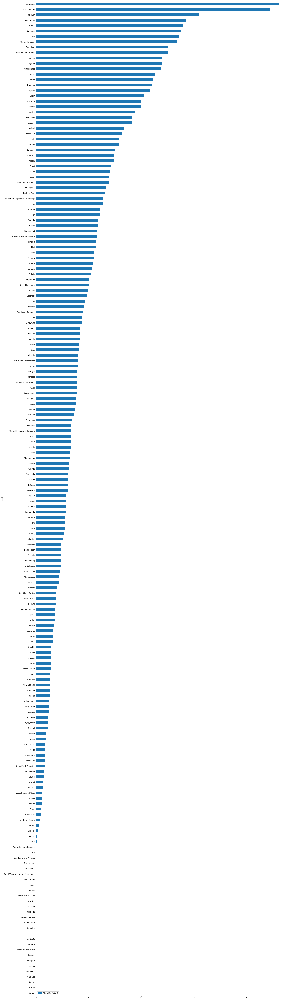

In [13]:
general["Mortality Rate %"] = general["4/28/20_d"] / general["4/28/20_i"] * 100
general = general.sort_values(by=['Mortality Rate %'],ascending=True)
general.plot(kind='barh',x='Country',y='Mortality Rate %',figsize=(25,100))
plt.show()

# Recovery Rate by Country (Number of Recovered / Number of Infected)

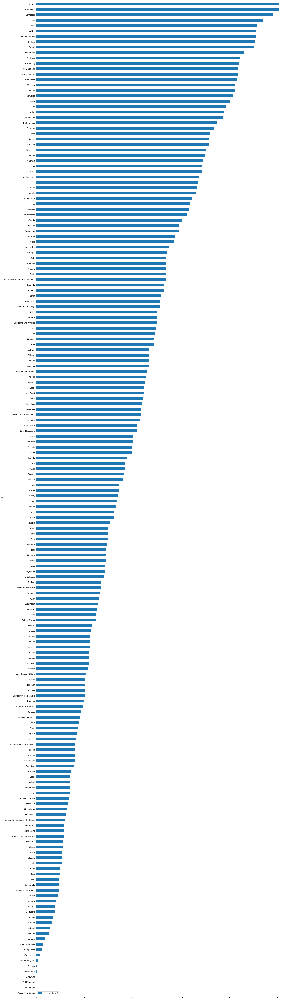

In [14]:
general["Recovery Rate %"] = general["4/28/20_r"] / general["4/28/20_i"] * 100
general = general.sort_values(by=['Recovery Rate %'],ascending=True)
general.plot(kind='barh',x='Country',y='Recovery Rate %',figsize=(25,100))
plt.show()

# Infection Rate vs Populational Density 

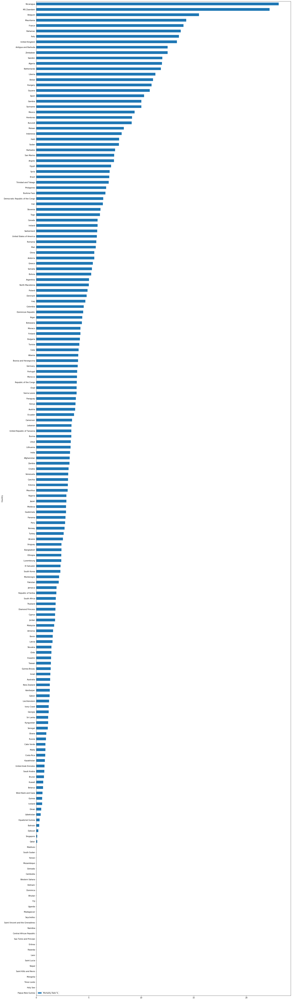

In [15]:
general["Mortality Rate %"] = general["4/28/20_d"] / general["4/28/20_i"] * 100
general = general.sort_values(by=['Mortality Rate %'],ascending=True)
general.plot(kind='barh',x='Country',y='Mortality Rate %',figsize=(25,100))
plt.show()

# Exporting CSV in order to be read by the osgeo

In [16]:
import os
general = general.sort_values(by=['Country'],ascending=True)
general.to_csv("general.csv",index=False)

# Since the values couldn't be evaluated in graduated mode as integers I had to transform them into floats in the QGIS GUI

In [17]:
import os
import sys
from osgeo import ogr
os.environ['QT_QPA_PLATFORM'] = 'offscreen'
sys.path.insert(0,'/usr/local/share/qgis/python')
from qgis.core import *
QgsApplication.setPrefixPath("/usr/local", True) 
from qgis.gui import *
from qgis import processing

from qgis.PyQt.QtGui import QColor, QImage
from qgis.PyQt.QtCore import QSize, QBuffer, QIODevice

qgs = QgsApplication([], False)
qgs.initQgis()
print(QgsApplication.showSettings())

Application state:
QGIS_PREFIX_PATH env var:		D:/QGIS/apps/qgis-ltr
Prefix:		D:/QGIS/apps/qgis-ltr
Plugin Path:		D:/QGIS/apps/qgis-ltr/plugins
Package Data Path:	D:/QGIS/apps/qgis-ltr/.
Active Theme Name:	
Active Theme Path:	D:/QGIS/apps/qgis-ltr/./resources/themes\\icons/
Default Theme Path:	:/images/themes/default/
SVG Search Paths:	/usr/local/./svg/
		D:/QGIS/apps/qgis-ltr/./svg/
		C:/Users/Posqg/AppData/Roaming/python\profiles\default/svg/
User DB Path:	D:/QGIS/apps/qgis-ltr/./resources/qgis.db
Auth DB Path:	C:/Users/Posqg/AppData/Roaming/python\profiles\default/qgis-auth.db



In [18]:
covid_gpkg = "Covid19-Final.gpkg"
conn = ogr.Open(covid_gpkg)
for i in conn:
    vlayer = QgsVectorLayer("{}|layername={}".format(covid_gpkg, i.GetName()), i.GetName(), "ogr")
    if not vlayer.isValid():
        print("Layer {} failed to load".format(i.GetName()))
    else:
        QgsProject.instance().addMapLayer(vlayer)
        print("Layer {} loaded".format(i.GetName()))


Layer Infected loaded
Layer Recovered loaded
Layer Deaths loaded
Layer Infection Rate % loaded
Layer Mortality Rate loaded
Layer Recovery Rate loaded
Layer countries loaded
Layer layer_styles loaded


In [19]:
layers = QgsProject.instance().mapLayers()
print(layers)

{'Deaths_446d7187_ddef_4ab8_a591_423e8e41dabf': <QgsMapLayer: 'Deaths' (ogr)>, 'Infected_44427eea_fc9d_48e6_82c4_5565f8cee8ba': <QgsMapLayer: 'Infected' (ogr)>, 'Infection_Rate___d2af1b7e_6877_49ef_bcca_4755da929d04': <QgsMapLayer: 'Infection Rate %' (ogr)>, 'Mortality_Rate_776d1acc_42c8_4be2_94ee_5480d5fa9cb1': <QgsMapLayer: 'Mortality Rate' (ogr)>, 'Recovered_71ba9b8d_408f_4856_b89c_a55f5ad916cc': <QgsMapLayer: 'Recovered' (ogr)>, 'Recovery_Rate_dd3e3ac5_3445_490e_9b36_e097adfe63d0': <QgsMapLayer: 'Recovery Rate' (ogr)>, 'countries_725a3732_5af7_4ee0_bfd0_37e7fbc04bf6': <QgsMapLayer: 'countries' (ogr)>, 'layer_styles_c552834e_3d2b_4c50_b251_e29c8893f7a2': <QgsMapLayer: 'layer_styles' (ogr)>}


In [21]:
countries_lr = QgsProject.instance().mapLayersByName('countries')[0]
infected_lr = QgsProject.instance().mapLayersByName('Infected')[0]
deaths_lr = QgsProject.instance().mapLayersByName('Deaths')[0]
recovered_lr = QgsProject.instance().mapLayersByName('Recovered')[0]
infection_rate_lr = QgsProject.instance().mapLayersByName('Infection Rate %')[0]
mortality_rate_lr = QgsProject.instance().mapLayersByName('Mortality Rate')[0]
recovery_rate_lr = QgsProject.instance().mapLayersByName('Recovery Rate')[0]

In [24]:
from IPython.display import Image

# Infected

In [27]:
xt = countries_lr.extent()
# print(xt)
width  = 5000
height = int(width*xt.height()/xt.width())
print("Gerar mapa com {} por {}".format(width, height))

options = QgsMapSettings()
options.setLayers([infected_lr,countries_lr])
options.setBackgroundColor(QColor(255, 255, 255))
options.setOutputSize(QSize(width, height))
options.setExtent(xt)
           
render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()

Gerar mapa com 5000 por 2411


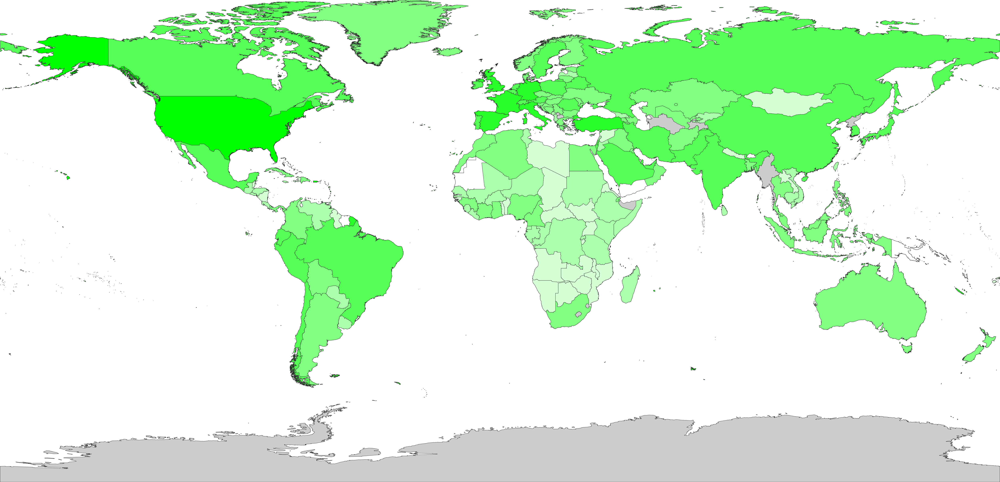

In [28]:
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
Image( imgbuf.data() )

# Deaths

In [31]:
options.setLayers([deaths_lr,countries_lr])

render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()

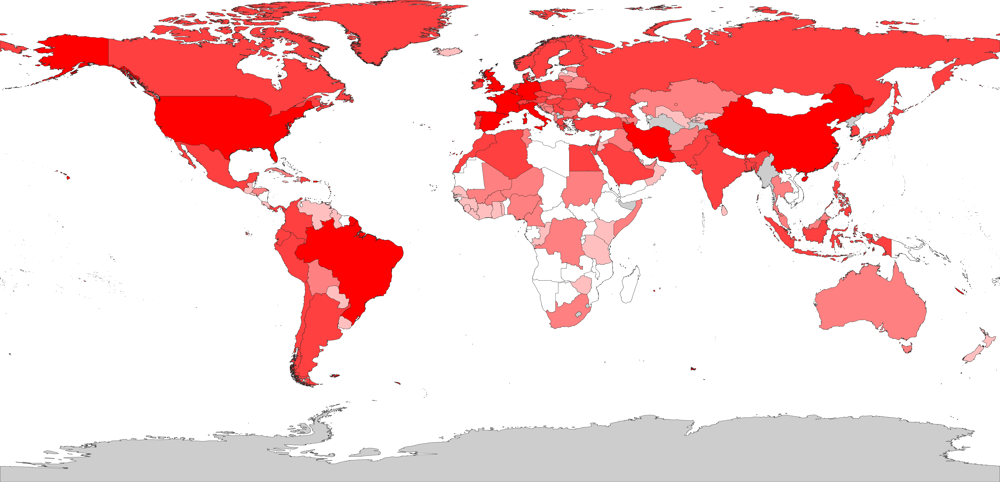

In [32]:
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
Image( imgbuf.data() )

# Recovered

In [33]:
options.setLayers([recovered_lr,countries_lr])

render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()

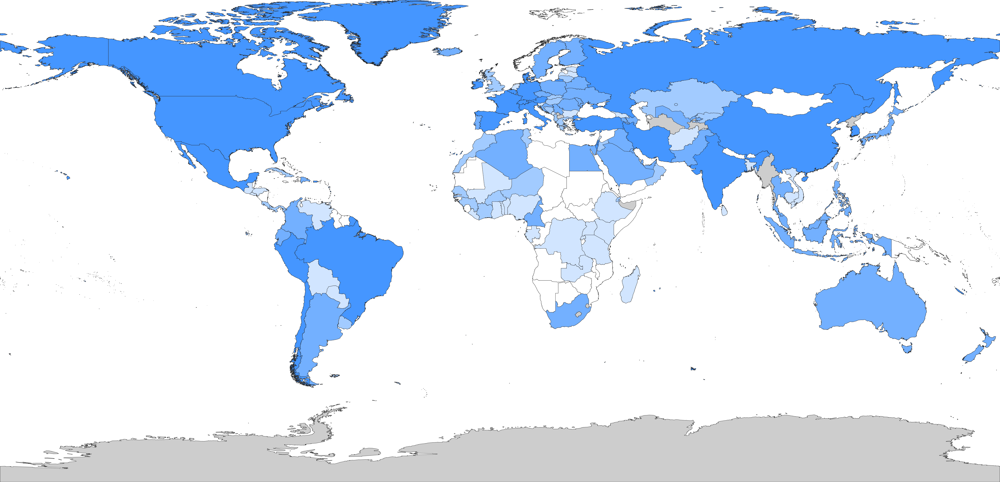

In [34]:
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
Image( imgbuf.data() )

# Infection Rate

In [36]:
options.setLayers([infection_rate_lr,countries_lr])

render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()

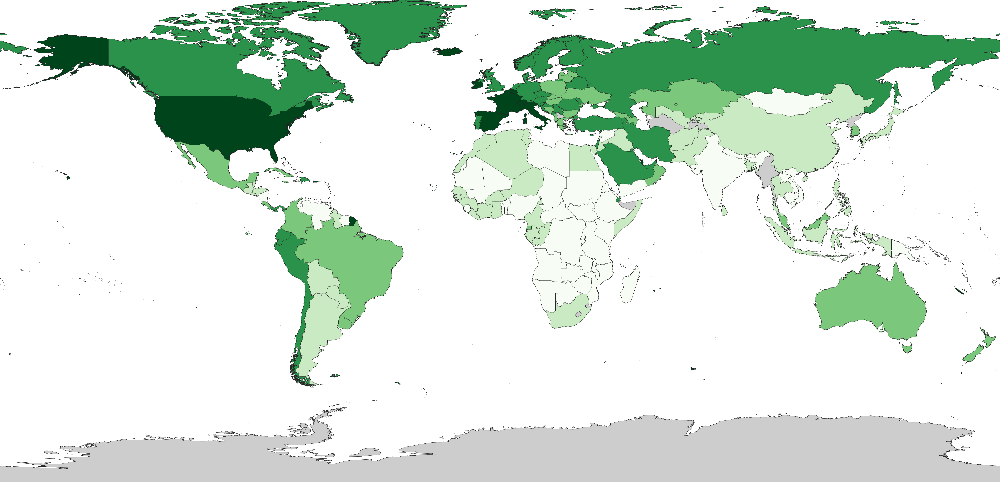

In [37]:
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
Image( imgbuf.data() )

# Mortality Rate

In [38]:
options.setLayers([mortality_rate_lr,countries_lr])

render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()

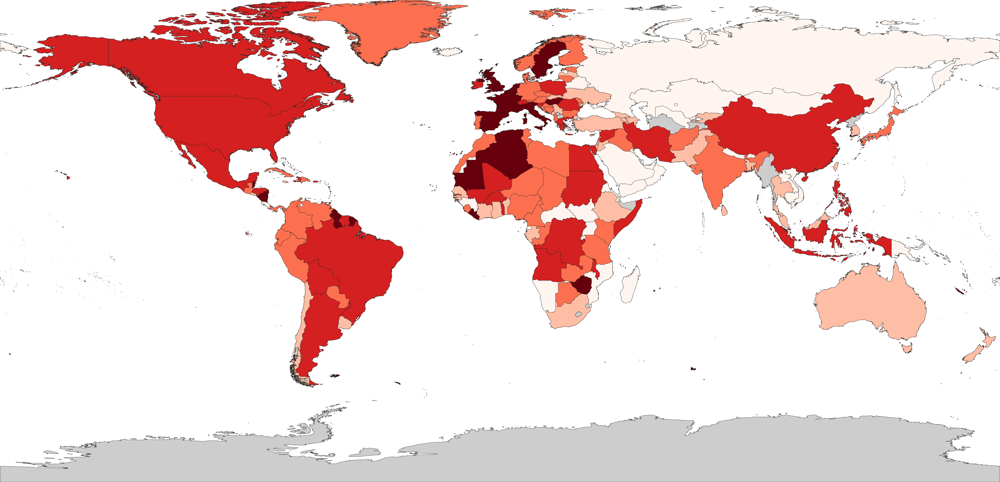

In [39]:
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
Image( imgbuf.data() )

# Recovery Rate

In [43]:
options.setLayers([recovery_rate_lr,countries_lr])

render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()

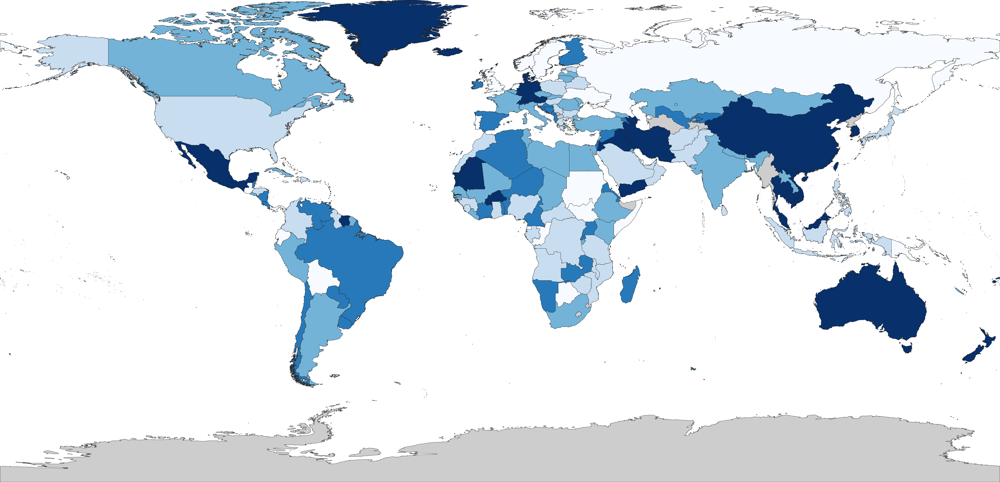

In [44]:
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
Image( imgbuf.data() )